In [1]:
# Loading R packages
library(reshape)
library(ggplot2)
library(phyloseq)
library(plyr)
library(dplyr)
library(plotly)
library(wesanderson)
library(vegan)


Attaching package: ‘plyr’

The following objects are masked from ‘package:reshape’:

    rename, round_any


Attaching package: ‘dplyr’

The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:reshape’:

    rename

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching package: ‘plotly’

The following objects are masked from ‘package:plyr’:

    arrange, mutate, rename, summarise

The following object is masked from ‘package:ggplot2’:

    last_plot

The following object is masked from ‘package:reshape’:

    rename

The following object is masked from ‘package:stats’:

    filter

The following object is masked from ‘package:graphics’:

    layout

Loading required package: permute
Loading required package: lattice
This is vegan 2.4-4


In [2]:
#ps = readRDS("../../../data/Seq_data/16S/CHTC/Dada2_Results/ps.merged")
ps = readRDS("../../../data/Seq_data/16S/CHTC/Dada2_Results_Full/ps.merged")

In [3]:
ps.norm = transform_sample_counts(ps, function(x) (x / sum(x)))
ps.hell = transform_sample_counts(ps, function(x) (x / sum(x))^0.5)
# Hellinger Transformation: "Particularly suited to species abundance data, 
    # this transformation gives low weights to variables with low counts and many zeros. 
    # The transformation itself comprises dividing each value in a data matrix by its row sum, 
    # and taking the square root of the quotient.

In [4]:
#ps.plot=subset_samples(ps.hell,Veg_Comm=="Open Wetland")
#ps.plot=subset_samples(ps.hell,Veg_Comm!="Open Wetland")
ps.plot = ps.hell

In [5]:
#ordinate(ps.hell, method = "NMDS", distance = "bray", k=3, trymax=1000)
dist = distance(ps.plot,method="bray")
ord = metaMDS(dist,k=2,trymax=1000)

Run 0 stress 0.1578158 
Run 1 stress 0.1578294 
... Procrustes: rmse 0.002482882  max resid 0.01673522 
Run 2 stress 0.184229 
Run 3 stress 0.1578164 
... Procrustes: rmse 0.001388227  max resid 0.01015738 
Run 4 stress 0.1577939 
... New best solution
... Procrustes: rmse 0.001431966  max resid 0.01161539 
Run 5 stress 0.157831 
... Procrustes: rmse 0.00322187  max resid 0.02823424 
Run 6 stress 0.1577941 
... Procrustes: rmse 7.888938e-05  max resid 0.0005400311 
... Similar to previous best
Run 7 stress 0.2374452 
Run 8 stress 0.1578158 
... Procrustes: rmse 0.001988146  max resid 0.01146715 
Run 9 stress 0.1577961 
... Procrustes: rmse 0.001389149  max resid 0.01015807 
Run 10 stress 0.1577959 
... Procrustes: rmse 0.001385146  max resid 0.01010525 
Run 11 stress 0.1577958 
... Procrustes: rmse 0.00138503  max resid 0.01011978 
Run 12 stress 0.1578308 
... Procrustes: rmse 0.003221584  max resid 0.02823566 
Run 13 stress 0.157831 
... Procrustes: rmse 0.003221749  max resid 0.02824

In [6]:
ord.plot = data.frame(ord$points)
# Extracting the coordinates from the ordination
ord.plot = merge(ord.plot,sample_data(ps.plot), by = 0)

In [7]:
sample_data(ps.plot)$C_N_ratio = sample_data(ps.plot)$TC_pct/sample_data(ps.plot)$Total_N_pct

In [8]:
#ps.jp = subset_samples(ps.plot,Veg_Comm=="Black Spruce")
#dist = distance(ps.jp,method="bray")
#ord = metaMDS(dist,k=2,trymax=1000)
#ord.plot = data.frame(ord$points)
# Extracting the coordinates from the ordination
#ord.plot = merge(ord.plot,sample_data(ps.jp), by = 0)

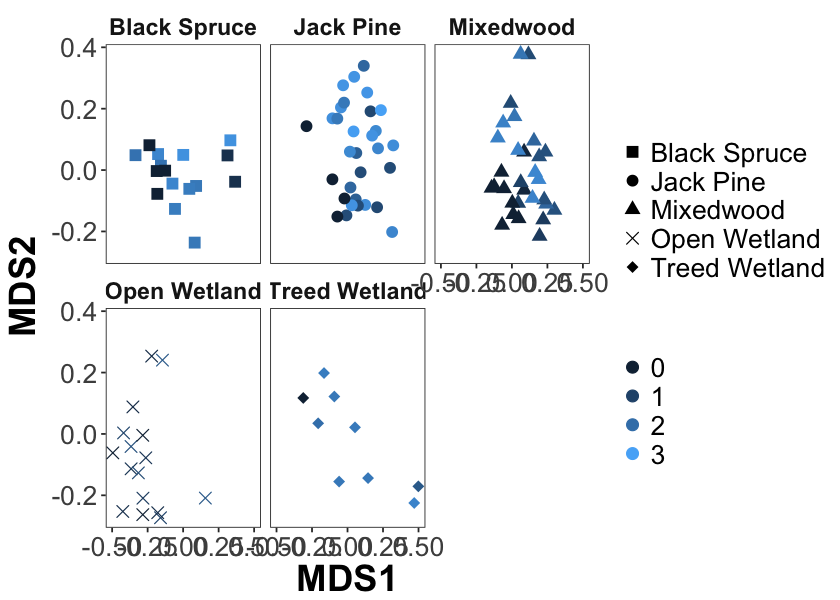

In [13]:
options(repr.plot.width=7, repr.plot.height=5)


p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = CBI, shape = Veg_Comm))

p = p  + geom_point(size=3)
#p = p + scale_colour_manual(values=c("red3","gold"))
p = p + scale_shape_manual(values=c(15,16,17,4,18))

p = p + guides(color=guide_legend(title=""),shape=guide_legend(title=""))
p = p + facet_wrap(~Veg_Comm)

#wetlands = ord.plot%>%
#    filter(Veg_Comm=="Open Wetland")
#p = p + geom_point(data=wetlands, aes(x=MDS1,y=MDS2), color="white", size=1.5)

p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))
p

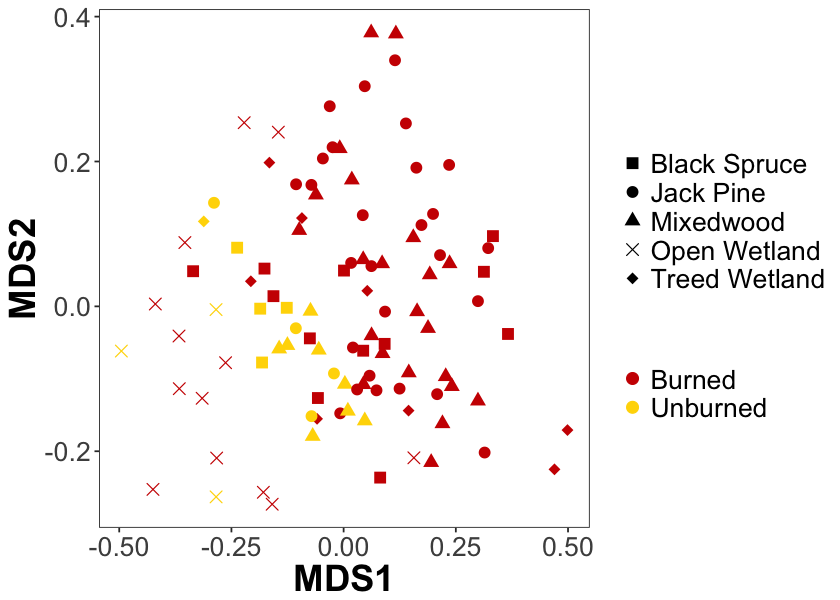

In [14]:
options(repr.plot.width=7, repr.plot.height=5)


p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = Burned_Unburned, shape = Veg_Comm))

p = p  + geom_point(size=3)
p = p + scale_colour_manual(values=c("red3","gold"))
p = p + scale_shape_manual(values=c(15,16,17,4,18))

p = p + guides(color=guide_legend(title=""),shape=guide_legend(title=""))
#p = p + facet_wrap(~Veg_Comm)

#wetlands = ord.plot%>%
#    filter(Veg_Comm=="Open Wetland")
#p = p + geom_point(data=wetlands, aes(x=MDS1,y=MDS2), color="white", size=1.5)

p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))

p

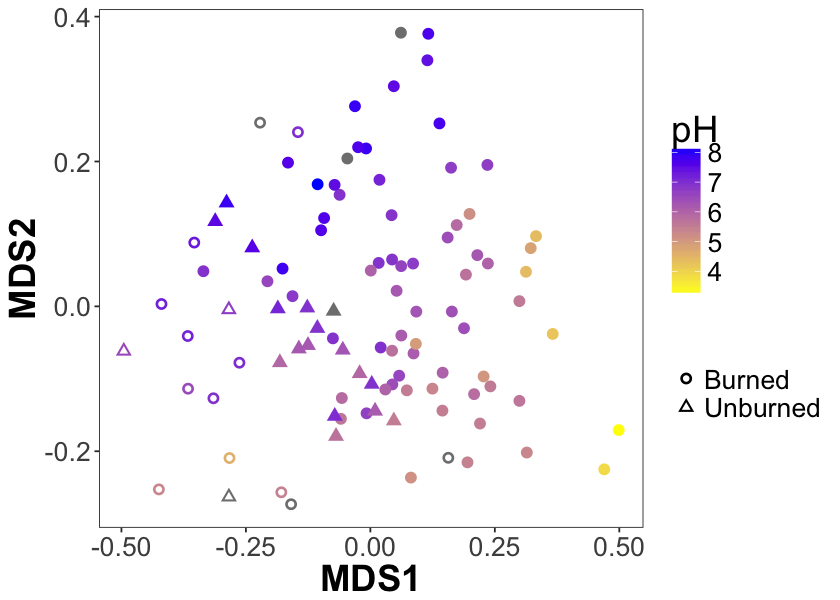

In [15]:
options(repr.plot.width=7, repr.plot.height=5)


p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = pH, shape = Burned_Unburned))

p = p  + geom_point(size=3)
p = p + scale_colour_gradient(low="yellow",high="blue")

p = p + guides(color=guide_colorbar(title="pH"),shape=guide_legend(title=""))
#p = p + facet_wrap(~Veg_Comm)

wetlands = ord.plot%>%
    filter(Veg_Comm=="Open Wetland")
p = p + geom_point(data=wetlands, aes(x=MDS1,y=MDS2), color="white", size=1.5)

p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))

p

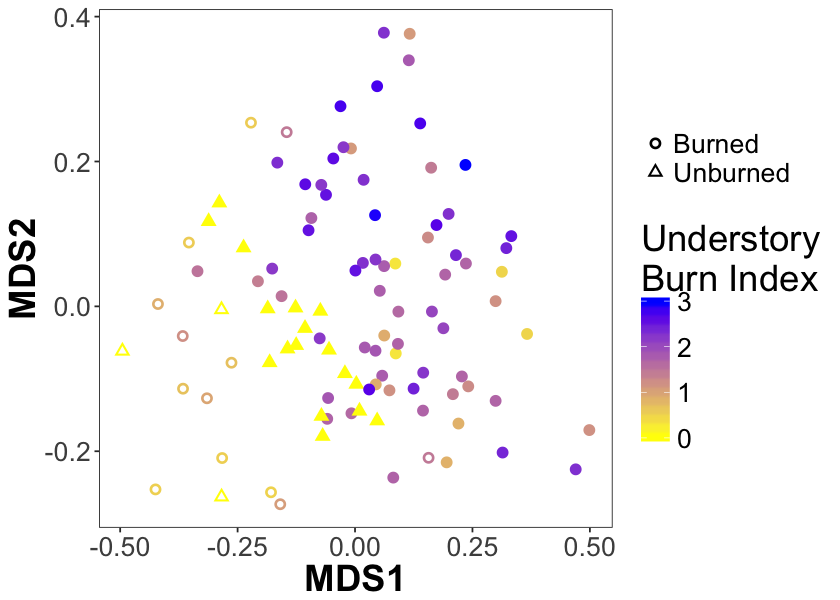

In [16]:
options(repr.plot.width=7, repr.plot.height=5)


p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = Understory_CBI, shape = Burned_Unburned))

p = p  + geom_point(size=3)
p = p + scale_colour_gradient(low="yellow",high="blue")

p = p + guides(color=guide_colorbar(title="Understory\nBurn Index"),shape=guide_legend(title=""))
#p = p + facet_wrap(~Veg_Comm)

wetlands = ord.plot%>%
    filter(Veg_Comm=="Open Wetland")
p = p + geom_point(data=wetlands, aes(x=MDS1,y=MDS2), color="white", size=1.5)

p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))

p

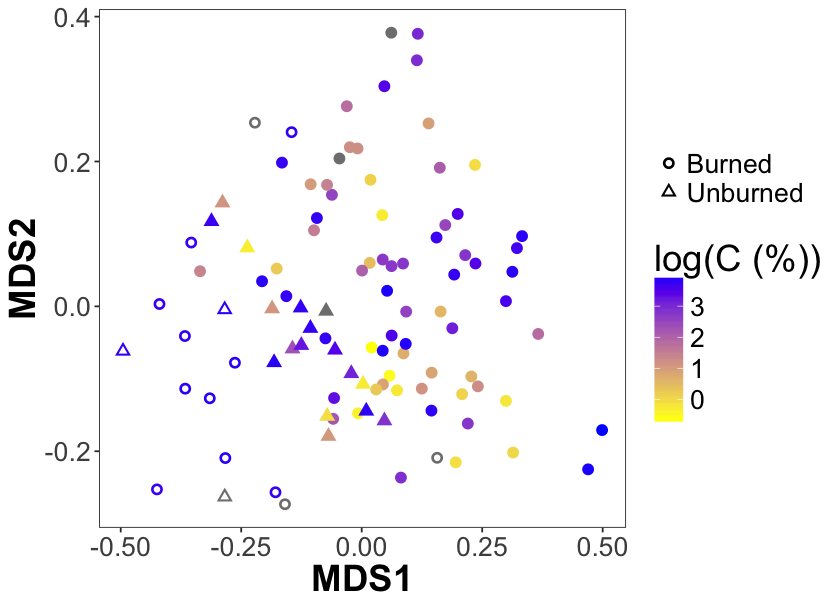

In [19]:
options(repr.plot.width=7, repr.plot.height=5)


p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = log(TC_pct), shape = Burned_Unburned))

p = p  + geom_point(size=3)
p = p + scale_colour_gradient(low="yellow",high="blue")

p = p + guides(color=guide_colorbar(title="log(C (%))"),shape=guide_legend(title=""))
#p = p + facet_wrap(~Veg_Comm)

wetlands = ord.plot%>%
    filter(Veg_Comm=="Open Wetland")
p = p + geom_point(data=wetlands, aes(x=MDS1,y=MDS2), color="white", size=1.5)

p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))

p

In [10]:
colnames(sample_data(ps.norm))

[1] "Barcodes"                  "Sample_ID"                
  [3] "Site_ID"                   "Org_or_Min"               
  [5] "Exch_Na_mg_kg"             "Exch_Mg_mg_kg"            
  [7] "Exch_K_mg_kg"              "Exch_Ca_mg_kg"            
  [9] "pH"                        "EC_mS_cm"                 
 [11] "CEC_cmol_kg"               "Total_N_pct"              
 [13] "Total_S_pct"               "Sand_pct"                 
 [15] "Clay_pct"                  "Silt_pct"                 
 [17] "Ca_mg_kg"                  "K_mg_kg"                  
 [19] "Mg_mg_kg"                  "Na_mg_kg"                 
 [21] "P_mg_kg"                   "S_mg_kg"                  
 [23] "Al_mg_kg"                  "Fe_mg_kg"                 
 [25] "Zn_mg_kg"                  "Cu_mg_kg"                 
 [27] "Mn_mg_kg"                  "Mo_mg_kg"                 
 [29] "TIC_ash_pct"               "TOC_LOI_pct"              
 [31] "TOC_HCL_cruc_pct"          "TC_pct"                   
 [33] "Fire_ID"                   "Ecosite"                  
 [35] "Moisture"                  "Moisture_Regime"          
 [37] "Nutrient"                  "Community"                
 [39] "Forest"                    "Plains"                   
 [41] "Interval"                  "Veg_Comm"                 
 [43] "Land_Class_Unburned"       "Land_Class"               
 [45] "Burned_Unburned"           "Understory_CBI"           
 [47] "Overstory_CBI"             "CBI"                      
 [49] "RBR"                       "Pct_Exposed_Mineral"      
 [51] "CFSI"                      "Burn_Severity_Index"      
 [53] "Mean_Duff_Depth_cm"        "O_Depth_cm"               
 [55] "Dead_Trees"                "Live_Trees"               
 [57] "nTrees"                    "Severity_Class"           
 [59] "temp"                      "rh"                       
 [61] "ws"                        "prec"                     
 [63] "ffmc"                      "dmc"                      
 [65] "dc"                        "isi"                      
 [67] "bui"                       "fwi"                      
 [69] "Correct_ID"                "Number_Fires_Recorded"    
 [71] "TSLF"                      "TSO"                      
 [73] "Fires_PerYear"             "Fires_PerDecade_Recording"
 [75] "Longest_Period_Btw_Fires"  "Shortest_Period_Btw_Fires"
 [77] "Mean_Period_Btw_Fires"     "Reburn_Severity_Index"    
 [79] "Overstory_Dens_ha"         "Understory_Dens_ha"       
 [81] "Abs_Density_Ha_UnderOver"  "PINUBAN_Stems_Ha"         
 [83] "PICEMAR_Stems_Ha"          "PICEGLA_Stems_Ha"         
 [85] "LARILAR_Stems_Ha"          "POPUTRE_Stems_Ha"         
 [87] "POPUBAL_Stems_Ha"          "BETUPAP_Stems_Ha"         
 [89] "PINUBAN_BA_per_Ha"         "PICEMAR_BA_per_Ha"        
 [91] "PICEGLA_BA_per_Ha"         "LARILAR_BA_per_Ha"        
 [93] "POPUTRE_BA_per_Ha"         "POPUBAL_BA_per_Ha"        
 [95] "BETUPAP_BA_per_Ha"         "BA_ha"                    
 [97] "Pct_Conifer_Stems_lar"     "Pct_Conifer_BA_lar"       
 [99] "Median_CBH"                "Flammable_T_ha"           
[101] "Conifer_CBD"               "Surface_Severity_Class"   
[103] "Soil_Class"

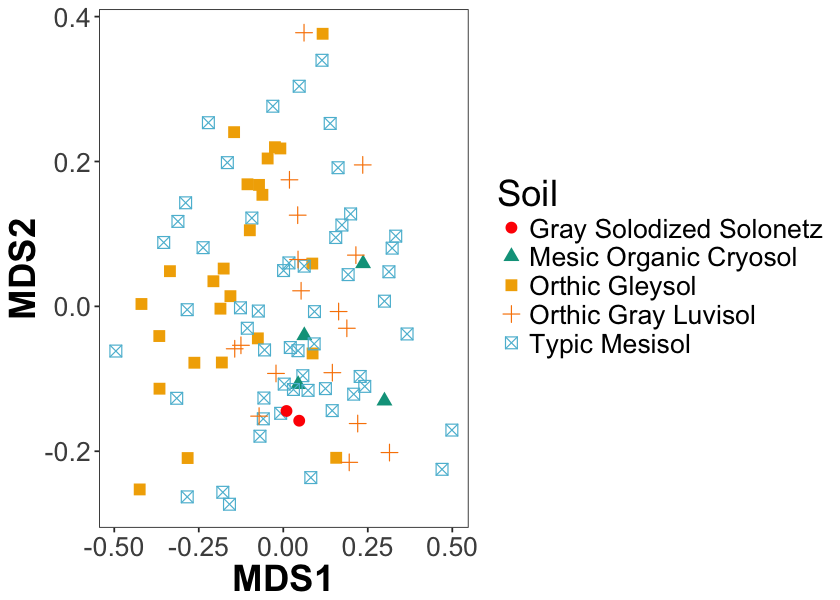

In [12]:
options(repr.plot.width=7, repr.plot.height=5)


#p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = Veg_Comm, shape = Burned_Unburned))
p = ggplot(ord.plot,aes(x=MDS1, y=MDS2, color = Soil_Class, shape = Soil_Class))
p = p  + geom_point(size=3)
#p = p + scale_colour_gradient(low="yellow",high="blue")

#p = p + guides(color=guide_colorbar(title="pH"),shape=guide_legend(title=""))
#p = p + facet_wrap(~Land_Class)

#wetlands = ord.plot%>%
#    filter(Veg_Comm=="Open Wetland")
#p = p + geom_point(data=wetlands, aes(x=MDS1,y=MDS2), color="white", size=1.5)

p = p + guides(color=guide_legend(title="Soil"),shape=guide_legend(title="Soil"))

p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))
p = p + scale_color_manual(values=wes_palette("Darjeeling"))

p

## Old approaches and notes

In [2]:
# Importing the dataset
ps = import_biom("../../data/Seq_data/QIIME_maxee2/OTU_table/feature-table-metaD-tax2.biom",parseFunction=parse_taxonomy_greengenes, "../../data/Seq_data/QIIME_maxee2/OTU_table/Trees3/fulltree2.rooted.tre")

Warning message in strsplit(msg, "\n"):
“input string 1 is invalid in this locale”

In [3]:
# Importing the sample data
df = read.csv("../../data/Soil_properties/WBNPNWT_Soils_2015_Metadata_File_QIIME.txt",sep="\t",header=TRUE, row.names=1)
# Import the file
Factors = colnames(df)
FactorClass = c("txt","txt","txt","txt","txt","txt","txt","txt","txt","txt","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","num","txt","txt","txt","num","txt","txt","num","num","txt","txt","txt","txt","txt","num","num","num","num","num","num","num","num","num","num","num","num","txt","num","num","num","num","num","num","num","num","num","num")
FactorSet = c("seq","sample","sample","sample","sample","sample","sample","seq","seq","seq","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","soil","class","class","class","class","class","class","class","class","class","class","class","class","sample","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","severity","codes","codes","codes","codes","codes","codes","codes","codes","codes","codes")
FactorTable = data.frame(Factors=Factors,Class=FactorClass,Set=FactorSet)
# Creating a dataframe with all the factors and whether or not they should be numeric
# And what set of data they belong to
### Selecting only numeric properties
for (i in colnames(sample_data(ps))) {
        if(FactorTable$Class[FactorTable$Factors==i]=="num"){
            sample_data(ps)[,i] = as.numeric(data.frame(sample_data(ps)[,i])[,1])
        }
    }
# Converting numbers to actual numbers
sample_data(ps)$TotalSeqs=sample_sums(ps)

Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning message:
“NAs introduced by coercion”Warning me

In [4]:
# Pulling out samples from this project only
ps.wb = prune_samples(sample_data(ps)$Project_ID=="WB15", ps)
ps.wb = prune_samples(sample_data(ps.wb)$Org_or_Min %in% c("O","M"), ps.wb)

In [5]:
# Merging lab replicates for analysis
ps.merged = merge_samples(ps.wb, "Sample_ID")

# This sums the OTUs for each sample ID, and averages the sample data
# That's an issue for the non-numeric sample data, so we have to add it back in.
# The code below is probably inefficient, but it works correctly.
names=colnames(sample_data(ps.wb))
notcommonnames = c('Sample_Name','Replicate','Project_ID','Fwd_Primer_Barcode','Rev_Primer_Barcode','Revcomp_Rev_Primer_Barcode')
commonnames = names[(names %in% notcommonnames)]
common_sample_data = sample_data(ps.wb)[ , -which(names(sample_data(ps.wb)) %in% commonnames)]
commonrownames=row.names(sample_data(ps.merged))
common_sample_data2 = common_sample_data[which(common_sample_data$Sample_ID %in% commonrownames),]
common_sample_data2 = common_sample_data2[!duplicated(common_sample_data2$Sample_ID), ]
row.names(common_sample_data2) = common_sample_data2$Sample_ID
sample_data(ps.merged)=common_sample_data2
sample_data(ps.merged)$TotalSeqs = sample_sums(ps.merged)

Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMeth

In [6]:
df = psmelt(ps.merged)

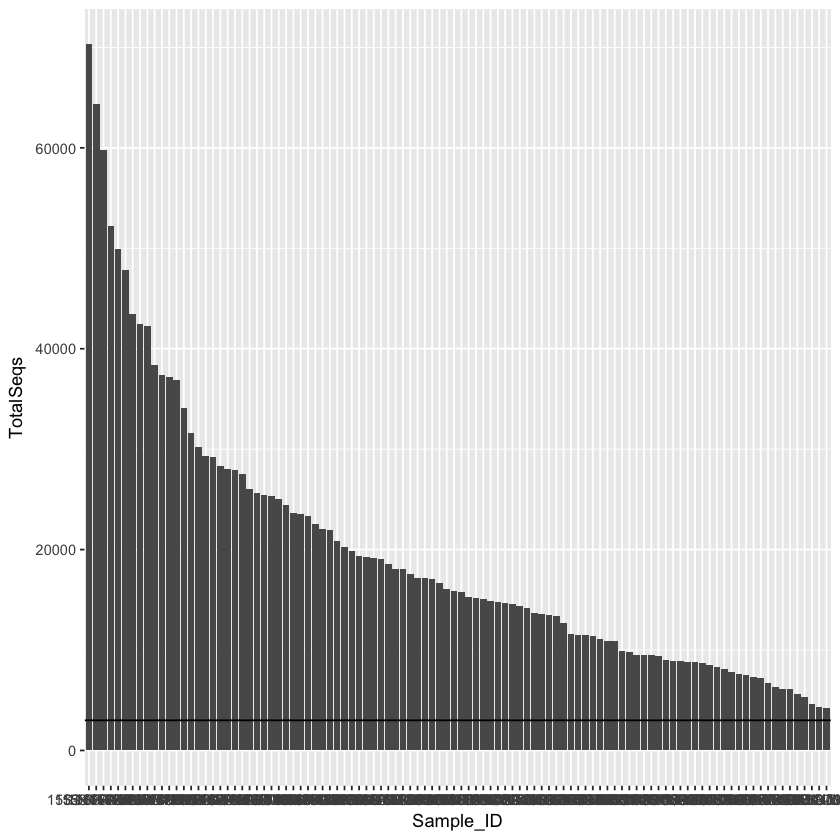

In [7]:
d = df %>%
    group_by(Sample_ID,TotalSeqs)%>%
    summarize()%>%
    arrange(-TotalSeqs)
d$Sample_ID = ordered(d$Sample_ID,levels=d$Sample_ID)
p = ggplot(d)
p = p + geom_bar(aes(x=Sample_ID, y=TotalSeqs), stat="identity")
p = p + geom_hline(yintercept=3000)
p

## Ordination plots

In [8]:
minseqs = 3000
ps.merged.min = prune_samples(sample_data(ps.merged)$TotalSeqs>minseqs,ps.merged)
ps.merged.min.norm = transform_sample_counts(ps.merged.min, function(x) x / sum(x) )
#ps = transform_sample_counts(ps, function(x) x / sum(x) )

In [22]:
Plotter = function(Org_or_Min,Land_Class){
    ps.plot = prune_samples(sample_data(ps.merged.min.norm)$Org_or_Min == Org_or_Min & sample_data(ps.merged.norm.min)$Land_Class == Land_Class, ps.merged.norm.min)
    trtmt = paste(levels(as.factor(sample_data(ps.plot)$Org_or_Min)),levels(as.factor(sample_data(ps.plot)$Land_Class)))
    ord = ordinate(ps.plot, method = "PCoA", distance = "unifrac", weighted=TRUE)
    resultslist = list(ps.plot,ord,trtmt)
    return(resultslist)
}

In [23]:
factors = expand.grid(Org_or_Min=c("O","M"),Land_Class=c("Upland","Wetland"))
#factors = factors[1:3,]
factors

Org_or_Min,Land_Class
O,Upland
M,Upland
O,Wetland
M,Wetland


In [24]:
PCoAs = mlply(factors,Plotter)

In [25]:
ActualPlotter = function(physeq,ord,trtmt){
    p = plot_ordination(physeq, ord, color = "CBI", shape = "Veg_Comm", axes=c(1,2))
    p = p  + geom_point(size=3.5) + scale_colour_gradient(low="yellow",high="red")
    p = p + guides(colour = guide_legend(), shape = guide_legend(""))
    p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))
    p = p + ggtitle(label=trtmt)
    return(p)
}

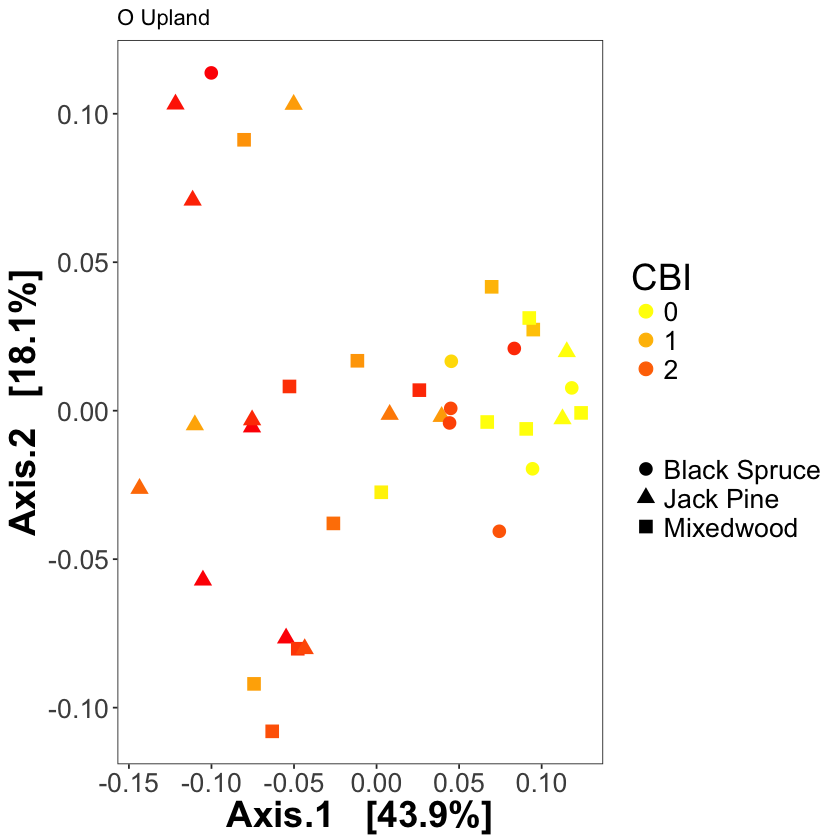

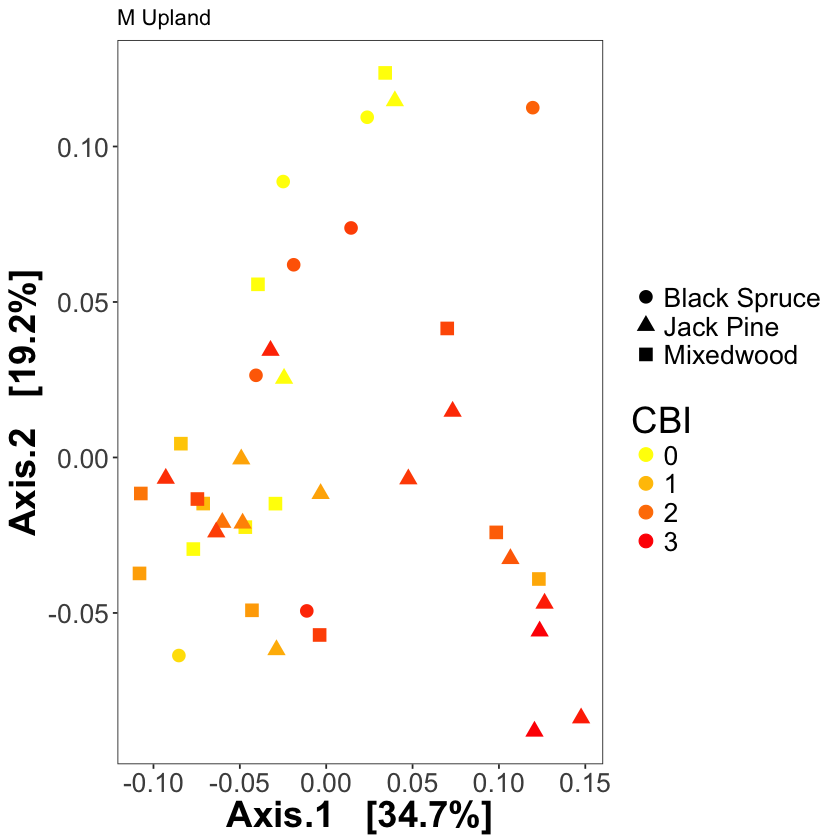

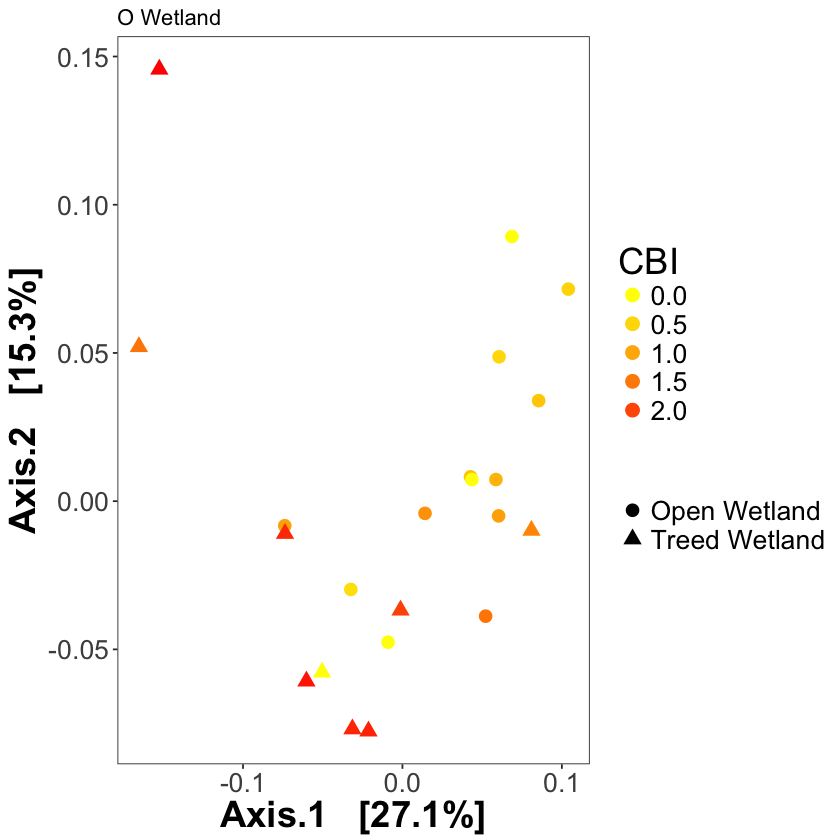

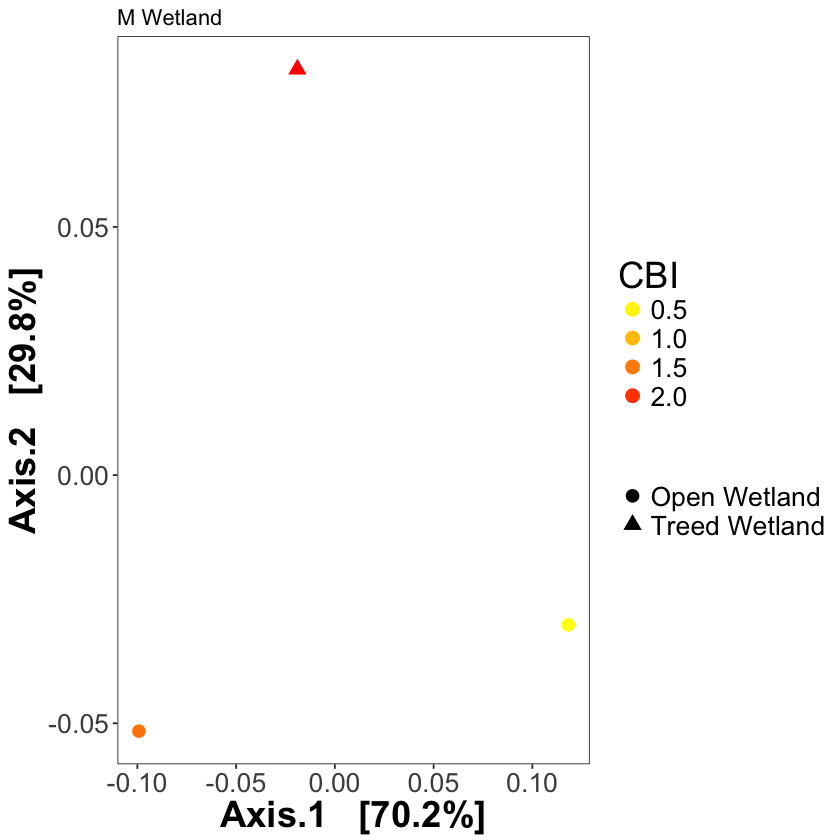

In [26]:
ActualPlotter(PCoAs[[1]][[1]],PCoAs[[1]][[2]],PCoAs[[1]][[3]])
ActualPlotter(PCoAs[[2]][[1]],PCoAs[[2]][[2]],PCoAs[[2]][[3]])
ActualPlotter(PCoAs[[3]][[1]],PCoAs[[3]][[2]],PCoAs[[3]][[3]])
ActualPlotter(PCoAs[[4]][[1]],PCoAs[[4]][[2]],PCoAs[[4]][[3]])

In [90]:
ord = ordinate(ps.merged.min.norm, method = "NMDS", distance = "bray", weighted=TRUE)

Run 0 stress 0.1678057 
Run 1 stress 0.1678066 
... Procrustes: rmse 0.0001377819  max resid 0.0009691557 
... Similar to previous best
Run 2 stress 0.1679504 
... Procrustes: rmse 0.005678125  max resid 0.04763563 
Run 3 stress 0.1678038 
... New best solution
... Procrustes: rmse 0.0009402194  max resid 0.006072552 
... Similar to previous best
Run 4 stress 0.1679508 
... Procrustes: rmse 0.005493906  max resid 0.04612148 
Run 5 stress 0.1684285 
Run 6 stress 0.167804 
... Procrustes: rmse 0.0001230543  max resid 0.0007262056 
... Similar to previous best
Run 7 stress 0.167804 
... Procrustes: rmse 3.948664e-05  max resid 0.000246425 
... Similar to previous best
Run 8 stress 0.167804 
... Procrustes: rmse 0.0001035246  max resid 0.0007113659 
... Similar to previous best
Run 9 stress 0.1678041 
... Procrustes: rmse 0.0008355394  max resid 0.005994957 
... Similar to previous best
Run 10 stress 0.1678044 
... Procrustes: rmse 0.0008391838  max resid 0.006012299 
... Similar to previo

In [96]:
colnames(sample_data(ps))

[1] "Al_mg_kg"                   "Barcodes"                  
 [3] "Burn_Severity_Index"        "Burned_Unburned"           
 [5] "CBI"                        "CEC_cmol_kg"               
 [7] "CFSI"                       "Ca_mg_kg"                  
 [9] "Clay_pct"                   "Community"                 
[11] "Cu_mg_kg"                   "Dead_Trees"                
[13] "EC_mS_cm"                   "Ecosite"                   
[15] "Fe_mg_kg"                   "Fire_ID"                   
[17] "Forest"                     "Fwd_Primer_Barcode"        
[19] "Interval"                   "K_mg_kg"                   
[21] "Land_Class"                 "Land_Class_Unburned"       
[23] "Live_Trees"                 "Mean_Duff_Depth_cm"        
[25] "Mg_mg_kg"                   "Mn_mg_kg"                  
[27] "Mo_mg_kg"                   "Moisture"                  
[29] "Moisture_Regime"            "Na_mg_kg"                  
[31] "Nutrient"                   "O_Depth_cm"                
[33] "Org_or_Min"                 "Overstory_CBI"             
[35] "P_mg_kg"                    "Pct_Exposed_Mineral"       
[37] "Plains"                     "Project_ID"                
[39] "RBR"                        "Replicate"                 
[41] "Rev_Primer_Barcode"         "Revcomp_Rev_Primer_Barcode"
[43] "S_mg_kg"                    "Sample_ID"                 
[45] "Sample_Name"                "Sand_pct"                  
[47] "Severity_Class"             "Silt_pct"                  
[49] "Site_ID"                    "TC_pct"                    
[51] "TIC_ash_pct"                "TOC_HCL_cruc_pct"          
[53] "TOC_LOI_pct"                "Total_N_pct"               
[55] "Total_S_pct"                "Understory_CBI"            
[57] "Veg_Comm"                   "Zn_mg_kg"                  
[59] "bui"                        "dc"                        
[61] "dmc"                        "ffmc"                      
[63] "fwi"                        "isi"                       
[65] "nTrees"                     "pH"                        
[67] "prec"                       "rh"                        
[69] "temp"                       "ws"                        
[71] "Total_C_pct"                "TotalSeqs"

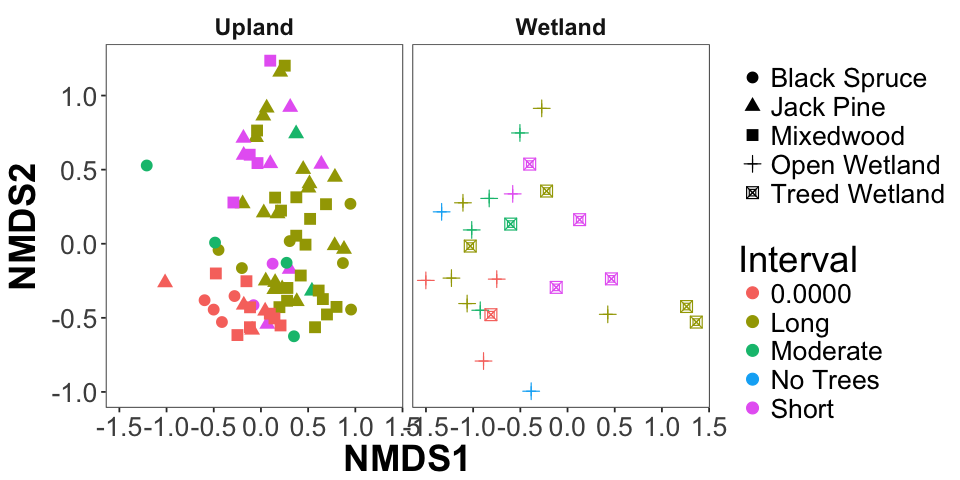

In [99]:
options(repr.plot.width=8, repr.plot.height=4)

p = plot_ordination(ps.merged.min.norm, ord, color = "Interval", shape = "Veg_Comm",  axes=c(1,2))
p = p  + geom_point(size=3) #+ scale_colour_gradient(low="red",high="blue")
p = p + guides(colour = guide_legend(), shape = guide_legend(""))
p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))
p = p + facet_wrap(~Land_Class)
p

## Plotting soil properties

In [34]:
SoilPlotter = function(ps,trtmt){
    df = sample_data(ps)
    # Setting various parameters as combined values
    df$pH = as.numeric(df$pH)
    df$Total_C_pct = as.numeric(df$TC_pct)
    df$Total_N_pct = as.numeric(df$Total_N_pct)
    df$S_mg_kg = as.numeric(df$S_mg_kg)
    df$Total_S_pct = as.numeric(df$Total_S_pct)
    df$Burn_Severity_Index= as.numeric(df$Burn_Severity_Index)
    df$CBI= as.numeric(df$CBI)
    df$RBR= as.numeric(df$RBR)
    df$CFSI= as.numeric(df$CFSI)
    df$Mean_Duff_Depth_cm = as.numeric(df$Mean_Duff_Depth_cm)
    df$Understory_CBI= as.numeric(df$Understory_CBI)
    df$Overstory_CBI= as.numeric(df$Overstory_CBI)
    df$Overstory_CBI= as.numeric(df$Overstory_CBI)
    df$Dead_Trees= as.numeric(df$Dead_Trees)
    df$Pct_Exposed_Mineral= as.numeric(df$Pct_Exposed_Mineral)
    df$dc = as.numeric(df$dc)
    df$fwi = as.numeric(df$fwi)
    df$dmc = as.numeric(df$dmc)
    df$ffmc = as.numeric(df$ffmc)
    p = ggplot(df, aes(x=pH,y=CBI, shape=Burned_Unburned, colour=Veg_Comm))
    p = p + geom_point(size=3)
    p = p + ggtitle(label=trtmt)
    p = p + scale_colour_manual(values=c(wes_palette("Darjeeling"),wes_palette("Darjeeling2")))
    return(p)
}

Warning message in SoilPlotter(PCoAs[[1]][[1]], PCoAs[[1]][[3]]):
“NAs introduced by coercion”Warning message in SoilPlotter(PCoAs[[1]][[1]], PCoAs[[1]][[3]]):
“NAs introduced by coercion”Warning message:
“Removed 3 rows containing missing values (geom_point).”

Warning message in SoilPlotter(PCoAs[[2]][[1]], PCoAs[[2]][[3]]):
“NAs introduced by coercion”

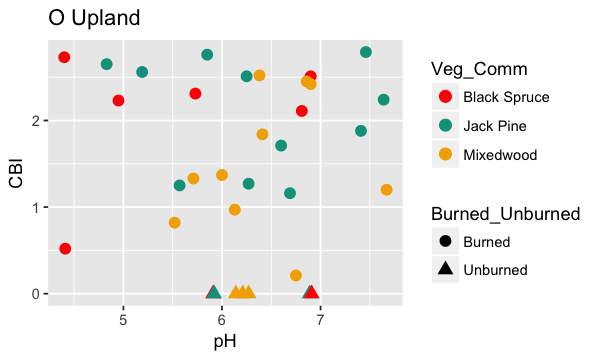

Warning message in SoilPlotter(PCoAs[[3]][[1]], PCoAs[[3]][[3]]):
“NAs introduced by coercion”Warning message in SoilPlotter(PCoAs[[3]][[1]], PCoAs[[3]][[3]]):
“NAs introduced by coercion”Warning message:
“Removed 2 rows containing missing values (geom_point).”

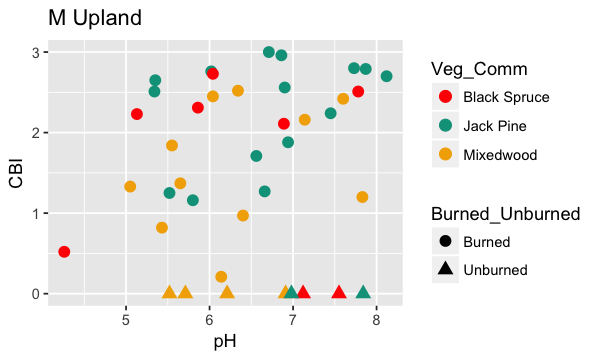

Warning message in SoilPlotter(PCoAs[[4]][[1]], PCoAs[[4]][[3]]):
“NAs introduced by coercion”Warning message in SoilPlotter(PCoAs[[4]][[1]], PCoAs[[4]][[3]]):
“NAs introduced by coercion”Warning message:
“Removed 2 rows containing missing values (geom_point).”

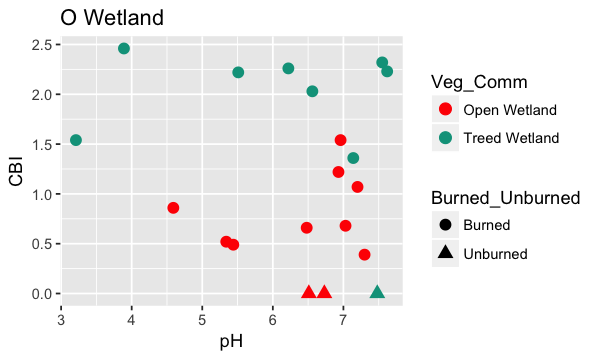

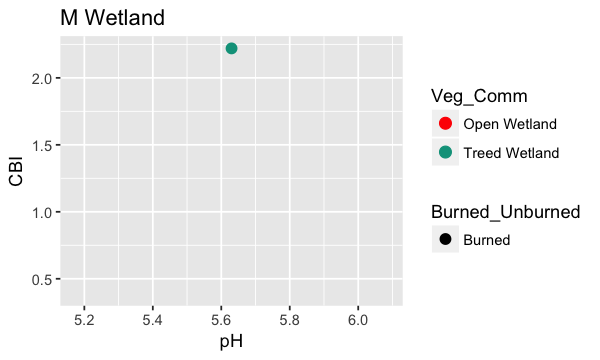

In [35]:
options(repr.plot.width=5, repr.plot.height=3)
SoilPlotter(PCoAs[[1]][[1]],PCoAs[[1]][[3]])
SoilPlotter(PCoAs[[2]][[1]],PCoAs[[2]][[3]])
SoilPlotter(PCoAs[[3]][[1]],PCoAs[[3]][[3]])
SoilPlotter(PCoAs[[4]][[1]],PCoAs[[4]][[3]])

### Regular ordinations

In [38]:
ps.merged.min.norm = prune_samples(sample_data(ps.merged.min.norm)$pH>0, ps.merged.min.norm)
ps.merged.min.norm = prune_samples(sample_data(ps.merged.min.norm)$Land_Class=="Upland", ps.merged.min.norm)

In [43]:
ord = ordinate(ps.merged.min.norm, method = "NMDS", distance = "bray")

Run 0 stress 0.1564903 
Run 1 stress 0.1564908 
... Procrustes: rmse 0.000160034  max resid 0.0009506066 
... Similar to previous best
Run 2 stress 0.1564895 
... New best solution
... Procrustes: rmse 0.0005266201  max resid 0.003264993 
... Similar to previous best
Run 3 stress 0.1564903 
... Procrustes: rmse 0.000552311  max resid 0.003427218 
... Similar to previous best
Run 4 stress 0.1564894 
... New best solution
... Procrustes: rmse 9.173279e-05  max resid 0.0005390052 
... Similar to previous best
Run 5 stress 0.1564909 
... Procrustes: rmse 0.0005914771  max resid 0.003688496 
... Similar to previous best
Run 6 stress 0.1564903 
... Procrustes: rmse 0.0005601107  max resid 0.0035754 
... Similar to previous best
Run 7 stress 0.1564894 
... Procrustes: rmse 6.602355e-06  max resid 3.390254e-05 
... Similar to previous best
Run 8 stress 0.1564894 
... Procrustes: rmse 1.285427e-05  max resid 5.629594e-05 
... Similar to previous best
Run 9 stress 0.1564907 
... Procrustes: rmse

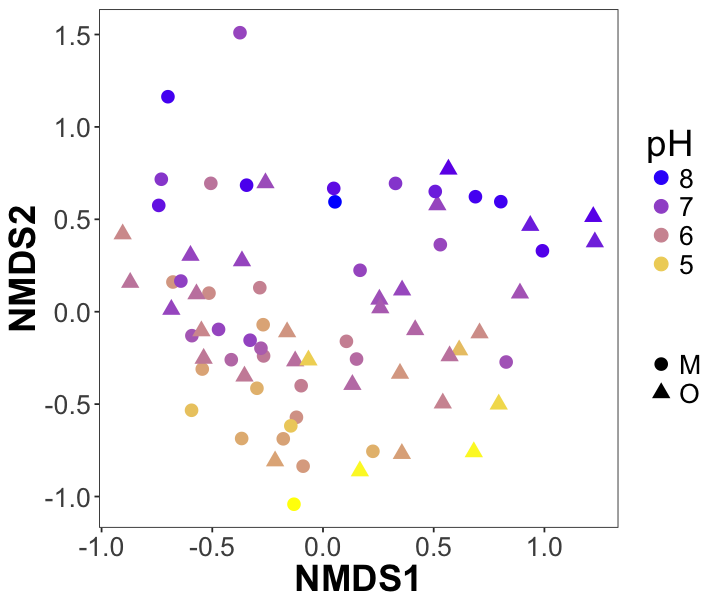

In [47]:
options(repr.plot.width=6, repr.plot.height=5)
p = plot_ordination(ps.merged.min.norm, ord, color = "pH", shape = "Org_or_Min", axes=c(1,2))

p = p  + geom_point(size=3.5) + scale_colour_gradient(low="yellow",high="blue")

p = p + guides(colour = guide_legend("pH", reverse=TRUE), shape = guide_legend(""))

p = p + theme_bw() +
  theme(
      #legend.position = "right",
      #legend.justification=c(0,1),
      #legend.position=c(0.05,0.6),
      #legend.box.just= "left",
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))

#p = p + facet_wrap(~Land_Class, ncol=1)

p

## 3-D Ordination plots

#### NMDS

In [88]:
dist = distance(ps.merged.min.norm,method="wunifrac")
ord = metaMDS(dist,k=3,trymax=1000)

Run 0 stress 0.09567722 
Run 1 stress 0.09568022 
... Procrustes: rmse 0.001407033  max resid 0.01207381 
Run 2 stress 0.09567684 
... New best solution
... Procrustes: rmse 0.0004134574  max resid 0.003366225 
... Similar to previous best
Run 3 stress 0.1008959 
Run 4 stress 0.09567703 
... Procrustes: rmse 0.0003580239  max resid 0.002987261 
... Similar to previous best
Run 5 stress 0.09568656 
... Procrustes: rmse 0.001151231  max resid 0.009814238 
... Similar to previous best
Run 6 stress 0.09567965 
... Procrustes: rmse 0.001134599  max resid 0.008336072 
... Similar to previous best
Run 7 stress 0.1010348 
Run 8 stress 0.09971972 
Run 9 stress 0.09567871 
... Procrustes: rmse 0.0007853942  max resid 0.006244272 
... Similar to previous best
Run 10 stress 0.09568089 
... Procrustes: rmse 0.0008041812  max resid 0.006907551 
... Similar to previous best
Run 11 stress 0.09567679 
... New best solution
... Procrustes: rmse 0.0009133145  max resid 0.005238104 
... Similar to previou

In [89]:
NMDS.coords = data.frame(ord$points)
# Extracting the coordinates from the ordination
NMDS.coords = merge(NMDS.coords,sample_data(ps.merged.min.norm), by = 0)
# Merging it with the sample data, by rowname (the same)
NMDS.coords = NMDS.coords %>%
    filter(Org_or_Min %in% c("O","M"))
plot_ly(NMDS.coords, x = NMDS.coords$MDS1, y = NMDS.coords$MDS2, z = NMDS.coords$MDS3, color = ~NMDS.coords$CBI
        #, colors = c("red3","tan4","darkorange","skyblue3","chartreuse4")
        , symbol = NMDS.coords$Land_Class, symbols = 1:2
        #, alpha = 0.5
       )%>%
    layout(scene = list(xaxis = list(title = "NMDS1"), yaxis = list(title = "NMDS2"),
          zaxis = list(title = "NMDS3")))%>%
    add_trace(type="scatter3d", mode="markers")

HTML widgets cannot be represented in plain text (need html)

#### PCoA

In [45]:
# Running PCoA ordination
ord = ordinate(ps.merged.min.norm, method = "PCoA", distance = "unifrac", weighted=TRUE)
ord.coords = data.frame(ord$vectors)
var = ord$values$Eigenvalues / sum(ord$values$Eigenvalues)

In [48]:
# Extracting the coordinates from the ordination
ord.plot = merge(ord.coords,sample_data(ps.merged.min.norm), by = 0)
# Merging it with the sample data, by rowname (the same)
ord.plot = ord.plot %>%
    filter(Org_or_Min %in% c("O","M"))
plot_ly(ord.plot, x = ord.plot$Axis.1, y = ord.plot$Axis.2, z = ord.plot$Axis.3
        , color = ~ord.plot$Burn_Severity_Index
        #, colors = c("red3","tan4","darkorange","skyblue3","chartreuse4")
        , symbol = ord.plot$Land_Class, symbols = 1:2
        #, alpha = 0.5
       )%>%
    layout(scene = list(xaxis = list(title = paste("PCo1 (",round(var[1]*100,1),"%)",sep="")), 
                        yaxis = list(title = paste("PCo2 (",round(var[2]*100,1),"%)",sep="")),
                        zaxis = list(title = paste("PCo3 (",round(var[3]*100,1),"%)",sep=""))))%>%
    add_trace(type="scatter3d", mode="markers")

HTML widgets cannot be represented in plain text (need html)

In [49]:
# Extracting the coordinates from the ordination
ord.plot = merge(ord.coords,sample_data(ps.merged.min.norm), by = 0)
# Merging it with the sample data, by rowname (the same)
ord.O = ord.plot[ord.plot$Org_or_Min=="O",]
ord.M = ord.plot[ord.plot$Org_or_Min=="M",]

plotfunction = function (ord){
    plot_ly(ord, x = ord$Axis.1, y = ord$Axis.2, z = ord$Axis.3
        , color = ~ord$Burn_Severity_Index
        #, colors = c("red3","tan4","darkorange","skyblue3","chartreuse4")
        , symbol = ord$Land_Class, symbols = 1:2
        #, alpha = 0.5
       )%>%
    layout(scene = list(xaxis = list(title = paste("PCo1 (",round(var[1]*100,1),"%)",sep="")), 
                        yaxis = list(title = paste("PCo2 (",round(var[2]*100,1),"%)",sep="")),
                        zaxis = list(title = paste("PCo3 (",round(var[3]*100,1),"%)",sep=""))))%>%
    add_trace(type="scatter3d", mode="markers")
}

pO = plotfunction(ord.O)
pM = plotfunction(ord.M)

pO
pM

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

In [115]:
# Extracting the coordinates from the ordination

# Merging it with the sample data, by rowname (the same)

plotfunction = function (physeq, dist="unifrac", color="CBI", symbol="Org_or_Min"){
    #print(physeq)
    sampledata=sample_data(physeq)
    ord = ordinate(physeq, method = "PCoA", distance = dist, weighted=TRUE)
    #print(ord$values$Eigenvalues)
    var = ord$values$Eigenvalues / sum(ord$values$Eigenvalues)
    #print(head(ord$vectors[,1:4]))
    plotdf = ord$vectors
    plotdf = merge(plotdf,sampledata, by = 0)
    print(head(plotdf[,1:4]))
    plot_ly(plotdf, x = plotdf$Axis.1, y = plotdf$Axis.2, z = plotdf$Axis.3
        , color = ~plotdf$color
        , symbol = plotdf$symbol, symbols = 1:2
       )%>%
    layout(scene = list(xaxis = list(title = paste("PCo1 (",round(var[1]*100,1),"%)",sep="")), 
                        yaxis = list(title = paste("PCo2 (",round(var[2]*100,1),"%)",sep="")),
                        zaxis = list(title = paste("PCo3 (",round(var[3]*100,1),"%)",sep=""))))%>%
    add_trace(type="scatter3d", mode="markers")
    return(p)
}

psMix = prune_samples(sample_data(ps.merged.norm.min)$Veg_Comm == "Mixedwood",ps.merged.norm.min)
psJP = prune_samples(sample_data(ps.merged.norm.min)$Veg_Comm == "Jack Pine",ps.merged.norm.min)

plotfunction(psMix, dist="bray")
plotfunction(psJP, dist="bray")

   Row.names      Axis.1      Axis.2      Axis.3
1 15S-NT-24M  0.18861883  0.06919110  0.01504619
2 15S-NT-24O -0.16006803 -0.02410277 -0.21934781
3 15S-NT-39M  0.24724082  0.14482732 -0.11872962
4 15S-NT-39O  0.15717363  0.10606933 -0.31514372
5 15S-NT-40M  0.22733762 -0.29024868  0.03139653
6 15S-NT-40O -0.08534365 -0.28551217 -0.18312796


HTML widgets cannot be represented in plain text (need html)

   Row.names       Axis.1       Axis.2       Axis.3
1 15S-NT-22M -0.368558784  0.110944011 -0.067151594
2 15S-NT-22O -0.269254247 -0.104680401  0.308004684
3 15S-NT-23M -0.280003477 -0.213050068  0.153517659
4 15S-NT-23O  0.352884976 -0.138761192  0.019904748
5 15S-NT-27M -0.366962230 -0.006096388 -0.002823496
6 15S-NT-27O -0.007881768 -0.083778922  0.134921757


HTML widgets cannot be represented in plain text (need html)